In [22]:
import sys
import os
import subprocess
import tarfile
import shutil
from functools import partial
from tqdm import tqdm
from tqdm.auto import tqdm
tqdm.pandas()

import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import (random_split, DataLoader, TensorDataset, ConcatDataset)
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits import mplot3d
from Bio import motifs

import boda
#from boda.generator.parameters import StraightThroughParameters
#from boda.generator import FastSeqProp
from boda.generator.plot_tools import matrix_to_dms, ppm_to_IC, ppm_to_pwm
#from boda.model.mpra_basset import MPRA_Basset
from boda.common import constants, utils

boda_src = os.path.join( os.path.dirname( os.path.dirname( os.getcwd() ) ), 'src' )
sys.path.insert(0, boda_src)

from main import unpack_artifact, model_fn
from pymeme import streme, parse_streme_output

import matplotlib

matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

In [23]:
#for variable-length sequences
def get_onehots(in_df, seq_column='nt_sequence', extra_str=''):
    padding_fn = partial(utils.row_pad_sequence,
                            in_column_name=seq_column,
                            padded_seq_len=600)    
    print('Padding sequences' + extra_str)
    sequence_list = list(in_df.progress_apply(padding_fn, axis=1))     
    print('Tokenizing sequences' + extra_str)
    onehot_sequences = torch.stack([utils.dna2tensor(subsequence) for subsequence in tqdm(sequence_list)])
    return onehot_sequences

def get_predictions(onehot_sequences, model, eval_batch_size = 128, num_workers=2, extra_str='', reverse_complement=False):
    temp_dataset = TensorDataset(onehot_sequences)
    temp_dataloader = DataLoader(temp_dataset, batch_size=eval_batch_size, shuffle=False, num_workers=num_workers)
    print('Getting predictions' + extra_str)  
    preds = []
    for local_batch in tqdm(temp_dataloader):
        if reverse_complement:
            in_tensor = utils.reverse_complement_onehot(local_batch[0])
        else:
            in_tensor = local_batch[0]
        preds.append(model(in_tensor.cuda()).cpu().detach().numpy())       
    preds_array = np.concatenate(preds, axis=0)  
    return preds_array

def single_scatterplot(data_df, x_axis, y_axis, color_axis, fig_size=(15,8), dot_size=0.5, title='',
                       dot_alpha=0.5, style='seaborn-whitegrid', colormap='winter',
                       x_label='True', y_label='Predicted', color_label='l2fc SE', title_font_size=18,
                       title_font_weight='medium', axis_font_size=16):
    with plt.style.context(style):
        fig, ax = plt.subplots(dpi=300)    
        data_df.plot(kind='scatter', x=x_axis, y=y_axis, figsize=fig_size, c=color_axis, ax=ax,
                        alpha=dot_alpha, s=dot_size, colormap=colormap, rasterized=True)
        plt.xlabel(x_label, fontsize=axis_font_size)
        plt.ylabel(y_label, fontsize=axis_font_size)

        f = plt.gcf()
        cax = f.get_axes()[1]
        cax.set_ylabel(color_label, fontsize=axis_font_size)

        x_min, y_min = data_df[[x_axis, y_axis]].min().to_numpy() 
        x_max, y_max = data_df[[x_axis, y_axis]].max().to_numpy()
        min_point, max_point = max(x_min, y_min), min(x_max, y_max)
        plt.plot((min_point,max_point), (min_point,max_point), color='black', linestyle='--', alpha=0.5)

        Pearson = round(data_df[[x_axis, y_axis]].corr(method='pearson')[x_axis][1], 2)
        Spearman = round(data_df[[x_axis, y_axis]].corr(method='spearman')[x_axis][1], 2)

        title = f'{title}  |  Pearson={Pearson}  Spearman={Spearman}'
        ax.set_title(title, fontdict={'fontsize': title_font_size, 'fontweight': title_font_weight}, pad=15)

In [3]:
if os.path.isdir('./artifacts'):
    shutil.rmtree('./artifacts')
hpo_rec = 'gs://syrgoth/aip_ui_test/model_artifacts__20211113_021200__287348.tar.gz'
unpack_artifact(hpo_rec)

model_dir = './artifacts'
model = model_fn(model_dir)
model.cuda()
model.eval()
print('')

archive unpacked in ./


Loaded model from 20211113_021200 in eval mode



In [36]:
#UKBB + GTEX + BODA30K
# all_boda_df = pd.read_csv('gs://syrgoth/data/MPRA_ALL_no_cutoffs_v2.txt', sep=" ", low_memory=False)
# all_boda_df.at[345812, 'nt_sequence'] = 'TGTAGAAAAAAATATATATATATATGAACAACGCATAATCCTGGAAATATAAGGAAAAATTAAATTTTCTCCTCTGGGAAAAATTTATACAGTAATGATTCTTGCTCTTTAATTTTTGTTTGAAAGAAATCTAGACATTTAAAAAACCCCAGTGGTAGAATTGTCTTGTTAAAAAGGGACATCAAGTAAAAGGCCAGGGG'
# all_boda_df = all_boda_df[(all_boda_df['chr'] == '7') | (all_boda_df['chr'] == '13')].reset_index(drop=True)

#Locus Select
locus_df = pd.read_csv('gs://syrgoth/data/MPRA_LocusSelect.txt', sep=" ", low_memory=False)
#locus_df = locus_df[(locus_df['project'] == 'Tiles-GATA') | (locus_df['project'] == 'Tiles-MYC')]
locus_df = locus_df.rename({'log2FoldChange': 'K562_mean'}, axis=1)
locus_df = locus_df[locus_df['K562_mean'].notnull()].reset_index(drop=True)

In [37]:
# onehot_sequences = get_onehots(all_boda_df)
onehot_sequences = get_onehots(locus_df)

Padding sequences


  0%|          | 0/99149 [00:00<?, ?it/s]

Tokenizing sequences


  0%|          | 0/99149 [00:00<?, ?it/s]

In [38]:
preds_array = get_predictions(onehot_sequences, model, reverse_complement=False)
preds_rc_array = get_predictions(onehot_sequences, model, reverse_complement=True)

Getting predictions


  0%|          | 0/775 [00:00<?, ?it/s]

Getting predictions


  0%|          | 0/775 [00:00<?, ?it/s]

In [39]:
# all_boda_df[['K562_pred', 'HepG2_pred', 'SKNSH_pred']] = preds_array
# all_boda_df[['K562_pred_rc', 'HepG2_pred_rc', 'SKNSH_pred_rc']] = preds_rc_array

# all_boda_df['K562_pred_aggreg'] = all_boda_df[['K562_pred', 'K562_pred_rc']].mean(axis=1)
# all_boda_df['HepG2_pred_aggreg'] = all_boda_df[['HepG2_pred', 'HepG2_pred_rc']].mean(axis=1)
# all_boda_df['SKNSH_pred_aggreg'] = all_boda_df[['SKNSH_pred', 'SKNSH_pred_rc']].mean(axis=1)

locus_df[['K562_pred', 'HepG2_pred', 'SKNSH_pred']] = preds_array
locus_df[['K562_pred_rc', 'HepG2_pred_rc', 'SKNSH_pred_rc']] = preds_rc_array

locus_df['K562_pred_aggreg'] = locus_df[['K562_pred', 'K562_pred_rc']].mean(axis=1)
locus_df['HepG2_pred_aggreg'] = locus_df[['HepG2_pred', 'HepG2_pred_rc']].mean(axis=1)
locus_df['SKNSH_pred_aggreg'] = locus_df[['SKNSH_pred', 'SKNSH_pred_rc']].mean(axis=1)

In [40]:
locus_df

,ID,SNP,chr,snp_pos,ref_allele,alt_allele,allele,window,strand,start,...,nt_sequence,K562_pred,HepG2_pred,SKNSH_pred,K562_pred_rc,HepG2_pred_rc,SKNSH_pred_rc,K562_pred_aggreg,HepG2_pred_aggreg,SKNSH_pred_aggreg
0,1:10437778:C:T:R:wC,1:10437778:C:T,1,10437778.0,C,T,ref,center,fwd,NaN,...,TGATGGTCATTGTTATGATTAAGATAATGCCGGGCAGGCCGGGCAC...,1.984271,0.113767,1.864825,1.941172,0.148552,1.820256,1.962721,0.131160,1.842540
1,1:10451799:C:T:R:wC,1:10451799:C:T,1,10451799.0,C,T,ref,center,fwd,NaN,...,TGCACTCCAGCCTGGGGAGCAAGAGCAAAATTCTGTCTCAAAAAAA...,0.078683,0.100373,-0.161266,-0.035533,-0.108438,-0.271498,0.021575,-0.004033,-0.216382
2,1:110198727:C:G:R:wC,1:110198727:C:G,1,110198727.0,C,G,ref,center,fwd,NaN,...,CACGCGCACAGCCGAGTCCCTGGGGACCCAGCAGAGGTCCGAAGCG...,6.970778,6.170108,7.033757,6.025497,5.224089,6.106389,6.498137,5.697099,6.570073
3,1:110881742:NA:NA,1:110881742:NA:NA,1,110881742.0,NaN,NaN,NaN,NaN,fwd,NaN,...,GCCCCTCGCACTCTGCGGTCACGTGACCCAAAGTGTTGAGGTGTTG...,3.728264,3.211835,3.972039,3.846533,3.422285,3.650783,3.787398,3.317060,3.811411
4,1:111838694:C:T:R:wC,1:111838694:C:T,1,111838694.0,C,T,ref,center,fwd,NaN,...,GAGATTGACCTGTGAGGCAGCAGCCTGGCAGGAGGAGGGGCATCCA...,5.067167,4.944032,5.442830,5.835971,5.668007,6.640472,5.451569,5.306020,6.041651
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99144,X:49880351-49880550,NaN,X,NaN,NaN,NaN,NaN,NaN,fwd,49880351.0,...,CCAAAGAAGAGCAAGGAGAAGCTTTGAAATTACAAGCCTCCACCTC...,-0.027095,-0.107106,0.443121,-0.034485,-0.147822,0.359009,-0.030790,-0.127464,0.401065
99145,X:49880401-49880600,NaN,X,NaN,NaN,NaN,NaN,NaN,fwd,49880401.0,...,GAGGTTTCTCACCAGCAGTGTTCAGTGCCAGGCCTTGGTGAGAAAT...,0.022686,0.537314,0.518672,-0.006817,0.362571,0.433568,0.007935,0.449942,0.476120
99146,X:49880451-49880650,NaN,X,NaN,NaN,NaN,NaN,NaN,fwd,49880451.0,...,AACCTGGGAAACAACCAAACCAGAATTAGAACTGCTGGGGCACAAC...,1.906606,1.913623,1.843416,2.198625,2.252561,1.995188,2.052615,2.083092,1.919302
99147,X:64815540:NA:NA,X:64815540:NA:NA,X,64815540.0,NaN,NaN,NaN,NaN,fwd,NaN,...,AGTTCTTTAGCGGTTGCTACAGCAAGTGGTCTAGTTGGGCCTGCAC...,4.752943,2.799047,2.845638,5.212957,2.856142,2.987801,4.982950,2.827595,2.916719


In [12]:
#all_boda_df.to_csv('MPRA_ALL_no_cutoffs_v2_pred.txt', index=None, sep=' ')
#locus_df.to_csv('MPRA_LocusSelect_pred_v1.txt', index=None, sep=' ')

In [30]:
#plot_df = all_boda_df[(all_boda_df['chr'] == '7') | (all_boda_df['chr'] == '13')]
#plot_df = locus_df[(locus_df['project'] == 'Tiles-GATA') | (locus_df['project'] == 'Tiles-MYC')]
#plot_df = locus_df[locus_df['project'] == 'Tiles-GATA']

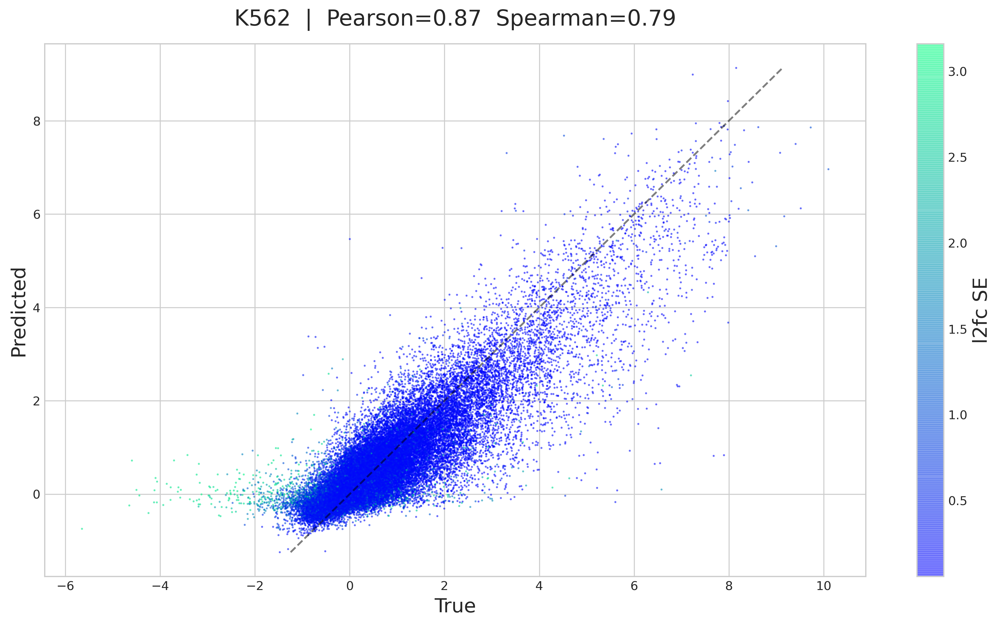

In [33]:
# single_scatterplot(plot_df, 'K562_mean', 'K562_pred', 'lfcSE')
# single_scatterplot(plot_df, 'K562_mean', 'K562_pred_rc', 'lfcSE')
single_scatterplot(plot_df, 'K562_mean', 'K562_pred_aggreg', 'lfcSE_k562', title='K562')
#plt.savefig('k562_test_scatter_raterized.pdf')

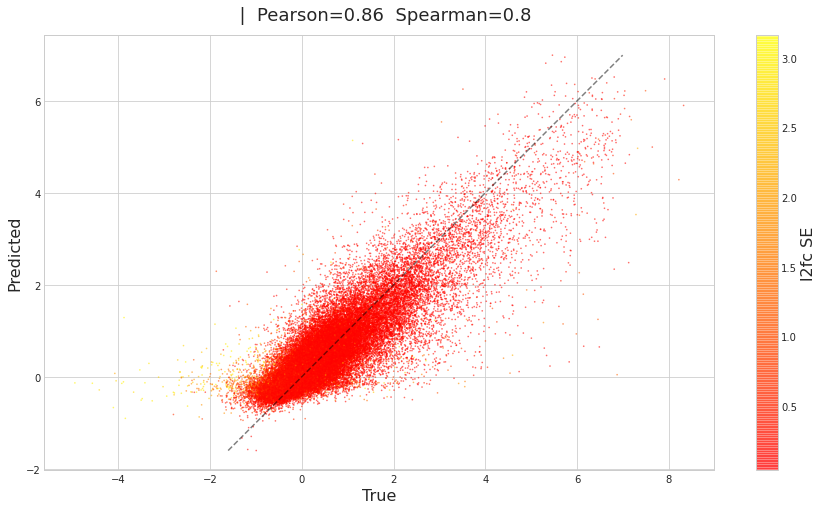

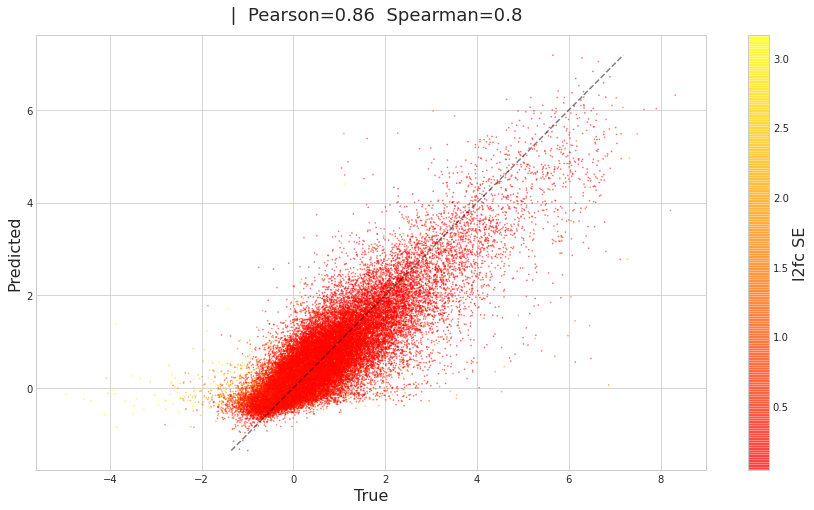

In [16]:
single_scatterplot(plot_df, 'HepG2_mean', 'HepG2_pred', 'lfcSE_hepg2', colormap='autumn')
single_scatterplot(plot_df, 'HepG2_mean', 'HepG2_pred_rc', 'lfcSE_hepg2', colormap='autumn')

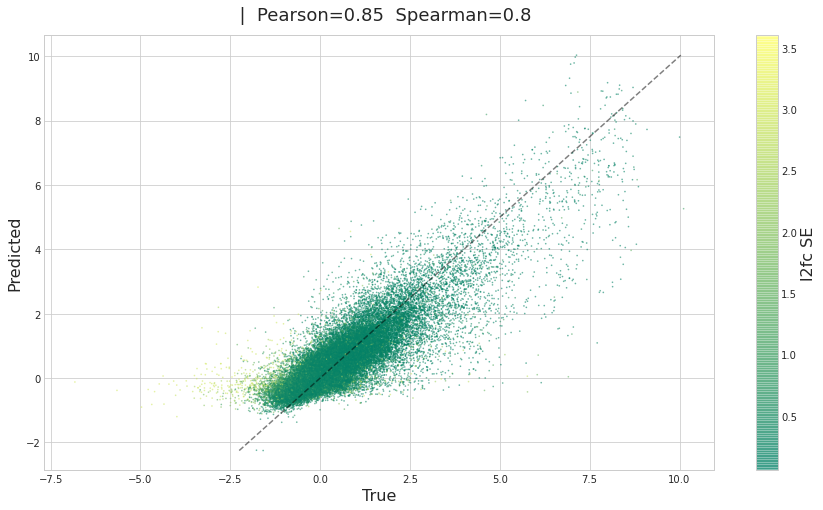

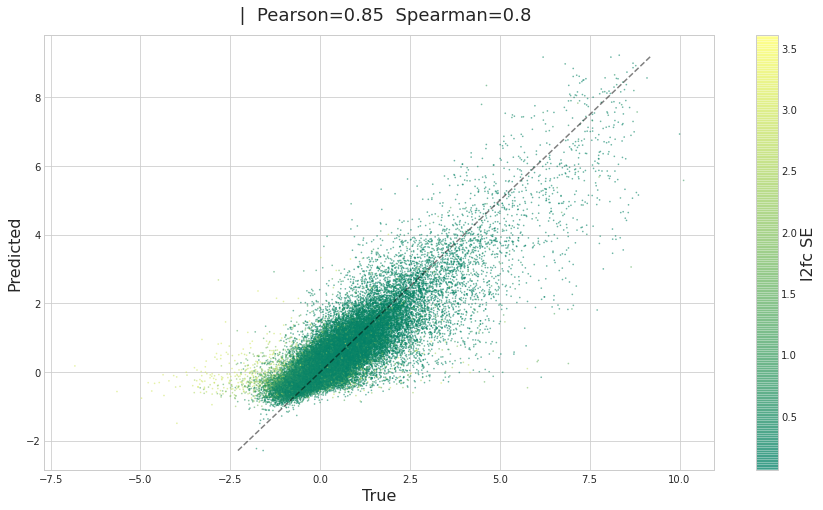

In [24]:
single_scatterplot(plot_df, 'SKNSH_mean', 'SKNSH_pred', 'lfcSE_sknsh', colormap='summer')
single_scatterplot(plot_df, 'SKNSH_mean', 'SKNSH_pred_rc', 'lfcSE_sknsh', colormap='summer')

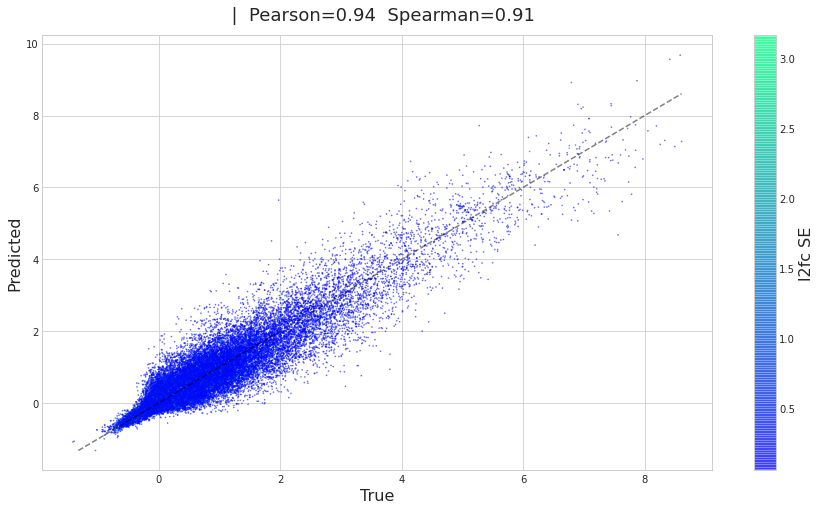

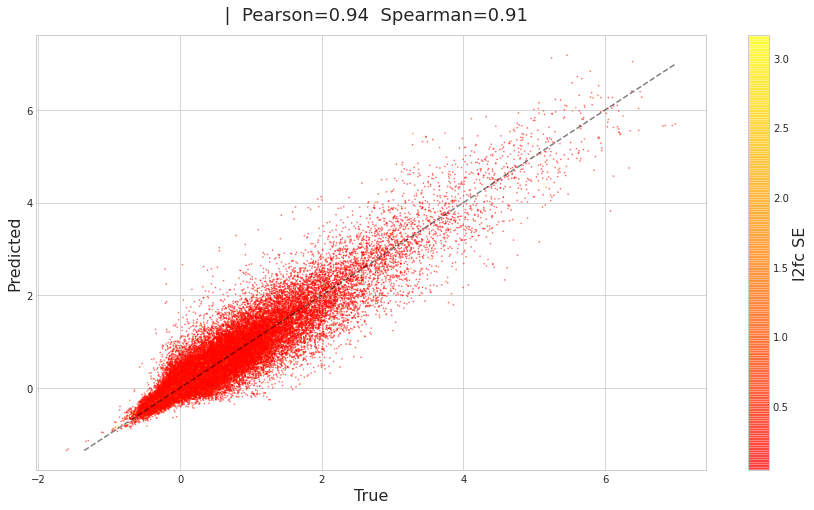

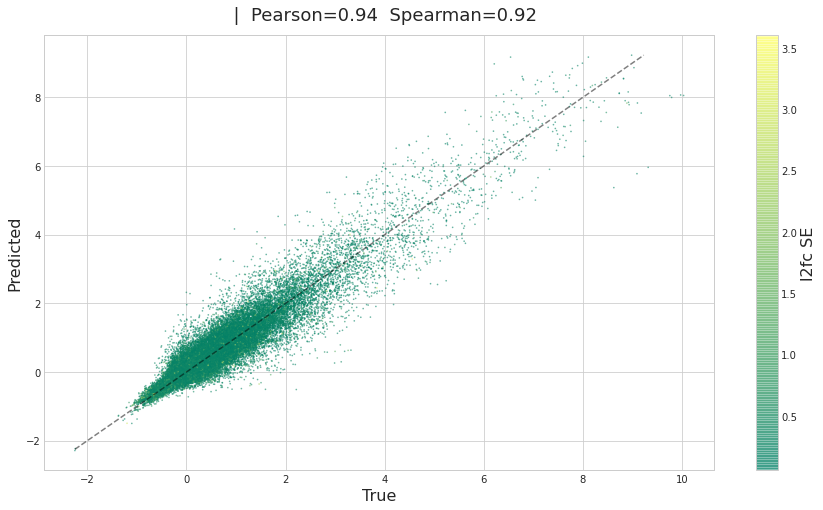

In [67]:
single_scatterplot(plot_df, 'K562_pred', 'K562_pred_rc', 'lfcSE_k562')
single_scatterplot(plot_df, 'HepG2_pred', 'HepG2_pred_rc', 'lfcSE_hepg2', colormap='autumn')
single_scatterplot(plot_df, 'SKNSH_pred', 'SKNSH_pred_rc', 'lfcSE_sknsh', colormap='summer')

In [22]:
# plot_df['K562_pred_aggreg'] = plot_df[['K562_pred', 'K562_pred_rc']].mean(axis=1)
# plot_df['HepG2_pred_aggreg'] = plot_df[['HepG2_pred', 'HepG2_pred_rc']].mean(axis=1)
# plot_df['SKNSH_pred_aggreg'] = plot_df[['SKNSH_pred', 'SKNSH_pred_rc']].mean(axis=1)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [26]:
plot_df.columns

Index(['ID', 'SNP', 'chr', 'snp_pos', 'ref_allele', 'alt_allele', 'allele',
       'window', 'strand', 'start', 'stop', 'project', 'haplotype',
       'Ctrl.Mean', 'Exp.Mean', 'K562_mean', 'lfcSE', 'stat', 'pvalue', 'padj',
       'nt_sequence', 'K562_pred', 'HepG2_pred', 'SKNSH_pred', 'K562_pred_rc',
       'HepG2_pred_rc', 'SKNSH_pred_rc', 'K562_pred_aggreg',
       'HepG2_pred_aggreg', 'SKNSH_pred_aggreg'],
      dtype='object')

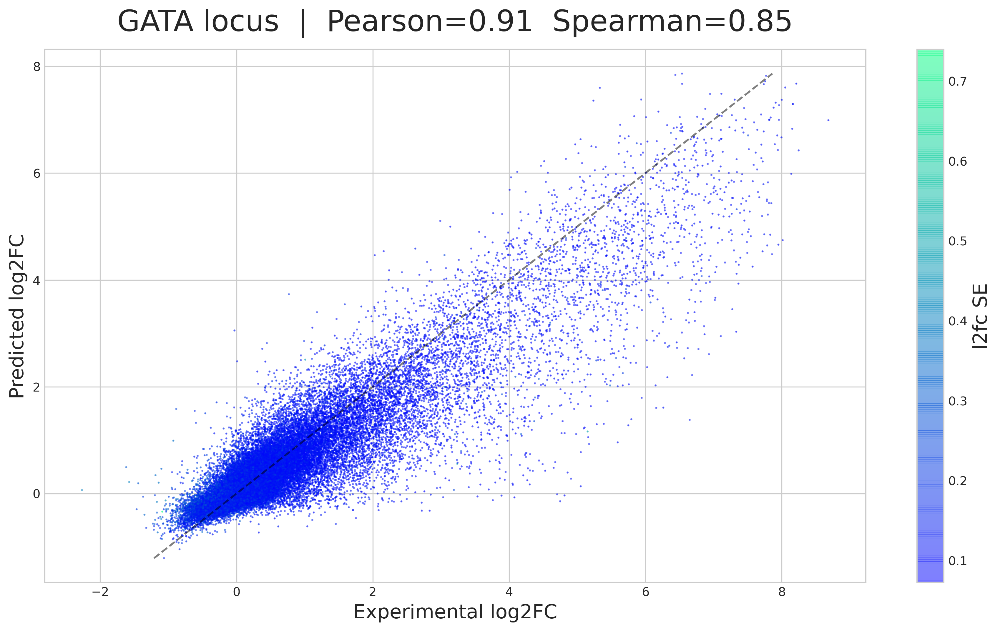

In [42]:
plot_df = locus_df[locus_df['project'] == 'Tiles-GATA'].reset_index(drop=True)

threshold = 100
data_filter = plot_df['Ctrl.Mean'] > threshold

single_scatterplot(plot_df[data_filter], 'K562_mean', 'K562_pred_aggreg', 'lfcSE', colormap='winter',
                   title='GATA locus', title_font_size=24, x_label='Experimental log2FC', y_label='Predicted log2FC')
#plt.savefig('gata_scatter.png', transparent=True)
#plt.savefig('gata_scatter.pdf')
plt.savefig('gata_scatter_raterized.pdf')

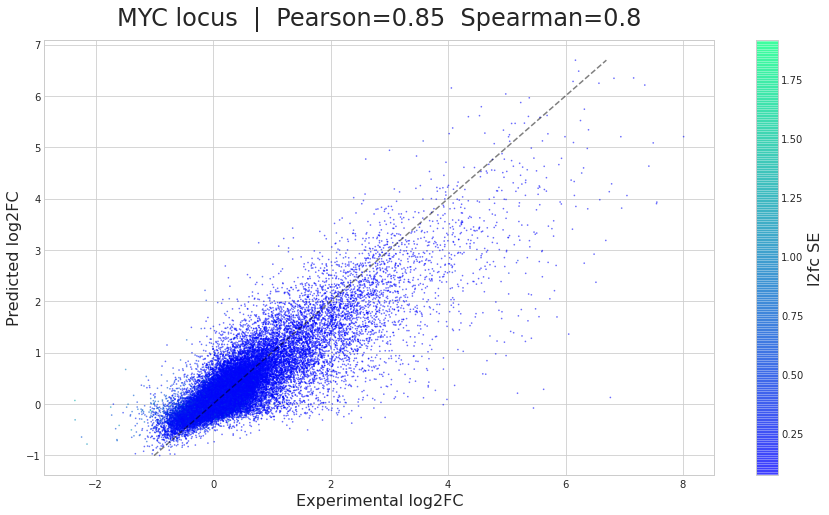

In [31]:
plot_df = locus_df[locus_df['project'] == 'Tiles-MYC']

threshold = 20
data_filter = plot_df['Ctrl.Mean'] > threshold

single_scatterplot(plot_df[data_filter], 'K562_mean', 'K562_pred_aggreg', 'lfcSE', colormap='winter',
                   title='MYC locus', title_font_size=24, x_label='Experimental log2FC', y_label='Predicted log2FC')
plt.savefig('myc_scatter.png', transparent=True)

64939


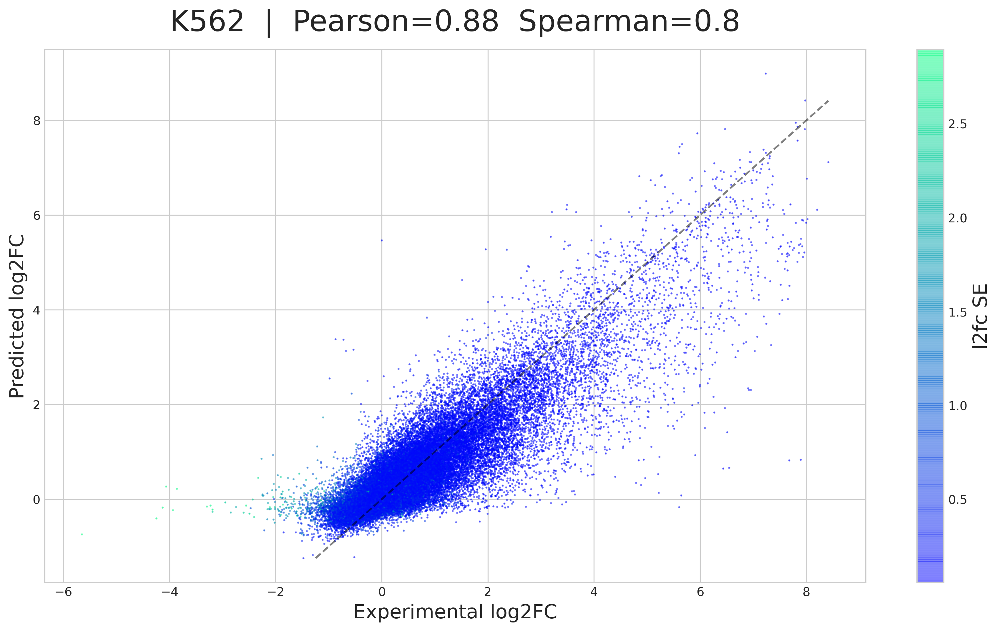

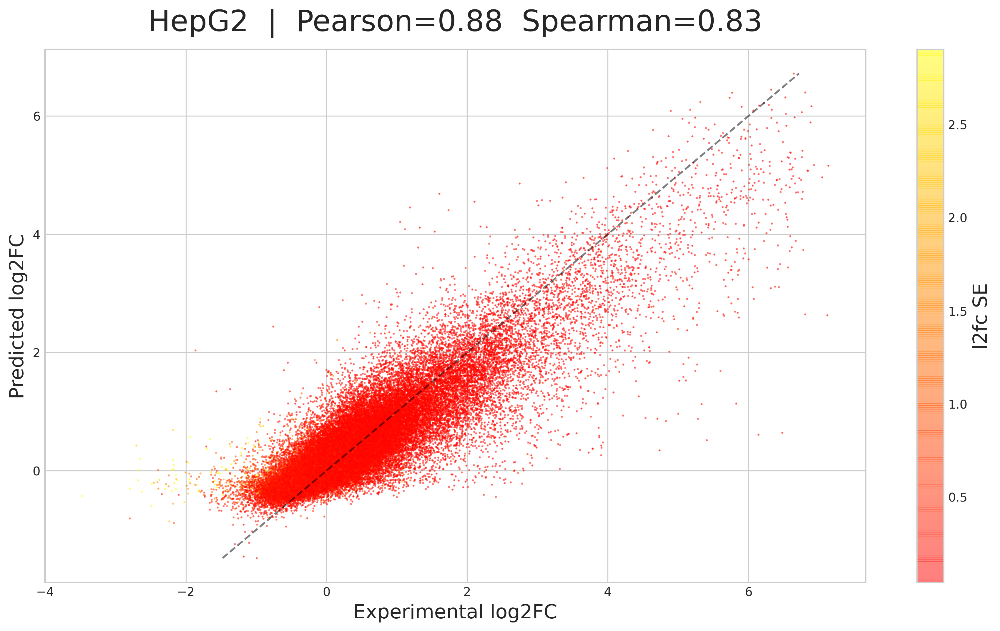

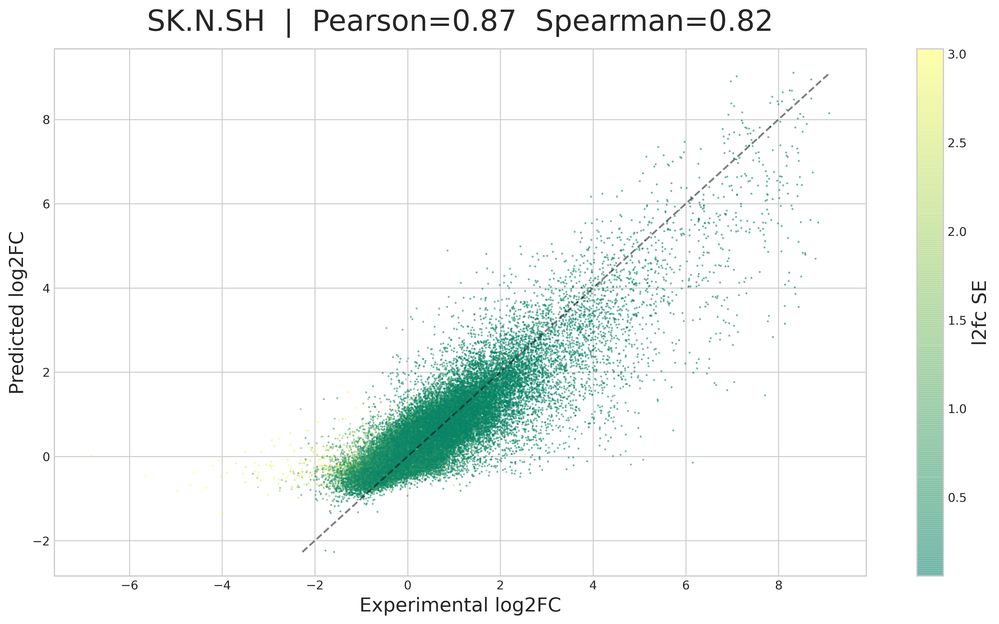

In [35]:
threshold = 20
plot_df = all_boda_df
data_filter = plot_df['ctrl_mean_k562'] > threshold


print(len(plot_df[data_filter]))
#single_scatterplot(plot_df[data_filter], 'K562_mean', 'K562_pred', 'lfcSE_k562')
single_scatterplot(plot_df[data_filter], 'K562_mean', 'K562_pred_aggreg', 'lfcSE_k562', colormap='winter',
                   title='K562', title_font_size=24, x_label='Experimental log2FC', y_label='Predicted log2FC')
#plt.savefig('test_k562.png', transparent=True)
plt.savefig('test_k562_rasterized.pdf')

# data_filter = plot_df['ctrl_mean_hepg2'] > threshold
# single_scatterplot(plot_df[data_filter], 'HepG2_mean', 'HepG2_pred', 'lfcSE_hepg2', colormap='autumn')
single_scatterplot(plot_df[data_filter], 'HepG2_mean', 'HepG2_pred_aggreg', 'lfcSE_hepg2', colormap='autumn',
                   title='HepG2', title_font_size=24, x_label='Experimental log2FC', y_label='Predicted log2FC')
#plt.savefig('test_hepg2.png', transparent=True)
plt.savefig('test_hepg2_rasterized.pdf')

# data_filter = plot_df['ctrl_mean_sknsh'] > threshold
# single_scatterplot(plot_df[data_filter], 'SKNSH_mean', 'SKNSH_pred', 'lfcSE_sknsh', colormap='summer')
single_scatterplot(plot_df[data_filter], 'SKNSH_mean', 'SKNSH_pred_aggreg', 'lfcSE_sknsh', colormap='summer',
                   title='SK.N.SH', title_font_size=24, x_label='Experimental log2FC', y_label='Predicted log2FC')
#plt.savefig('test_sknsh.png', transparent=True)
plt.savefig('test_sknsh_rasterized.pdf')

In [60]:
def reverse_complement_str(sequence_str):
    return ''.join([constants.DNA_COMPLEMENTS[letter] for letter in reversed(sequence_str)])

In [61]:
plot_df['nt_sequence_rc'] = plot_df.apply(lambda x: reverse_complement_str(x['nt_sequence']), axis=1)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [62]:
reversed_onehot_sequences = get_onehots(plot_df, seq_column='nt_sequence_rc')

Padding sequences


  0%|          | 0/66712 [00:00<?, ?it/s]

Tokenizing sequences


  0%|          | 0/66712 [00:00<?, ?it/s]

In [63]:
reversed_preds_array = get_predictions(reversed_onehot_sequences, model, reverse_complement=False)

Getting predictions


  0%|          | 0/522 [00:00<?, ?it/s]

In [64]:
plot_df[['K562_pred_RC', 'HepG2_pred_RC', 'SKNSH_pred_RC']] = reversed_preds_array

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/opt/conda/lib/python3.7/site-packages/pandas/core/indexing.py:1736: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value[:, i].tolist())


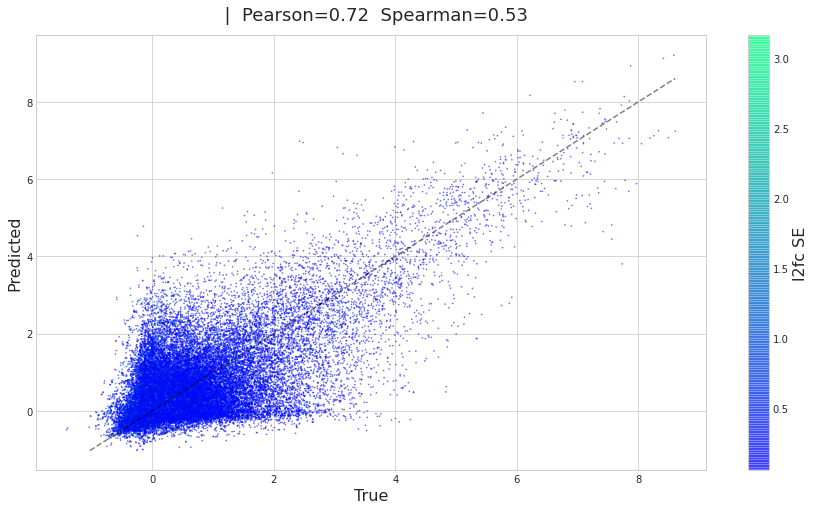

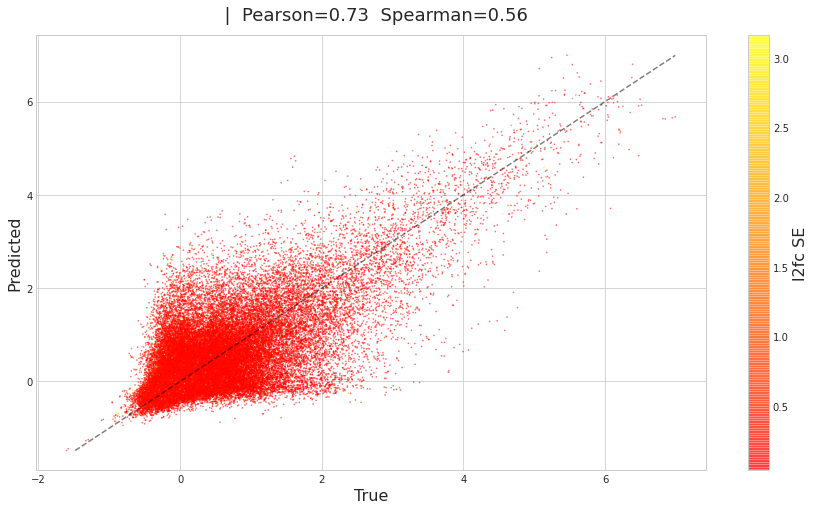

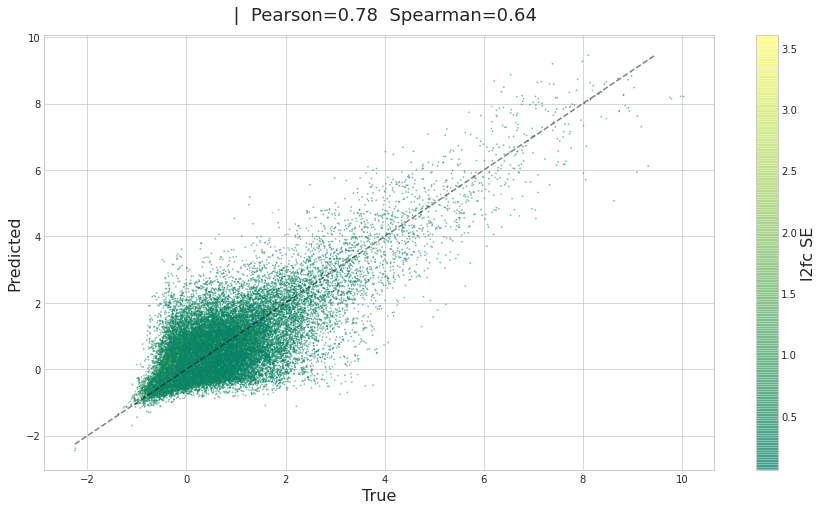

In [66]:
single_scatterplot(plot_df, 'K562_pred', 'K562_pred_RC', 'lfcSE_k562')
single_scatterplot(plot_df, 'HepG2_pred', 'HepG2_pred_RC', 'lfcSE_hepg2', colormap='autumn')
single_scatterplot(plot_df, 'SKNSH_pred', 'SKNSH_pred_RC', 'lfcSE_sknsh', colormap='summer')